Emma Witanowski

***


# Part 2: Sensor Locations

Libraries + Install any missing packages

In [2]:
#!pip install census us

import numpy as np
import geopandas as gpd
from census import Census
import rasterio
from shapely.geometry import box
import matplotlib.pyplot as plt
from rasterstats import zonal_stats
import pandas as pd
from scipy.ndimage import distance_transform_edt
from rasterio.features import rasterize
import xarray as xr
from us import states
from rasterio.mask import mask
from scipy import stats
import contextily as ctx
import glob
from shapely.ops import unary_union
from factor_analyzer import FactorAnalyzer, Rotator
from rasterio.merge import merge
from sklearn.preprocessing import StandardScaler
from shapely.validation import make_valid
import rioxarray as rxr
from sklearn.decomposition import PCA

****

### Rhode Island Attempt

<Axes: >

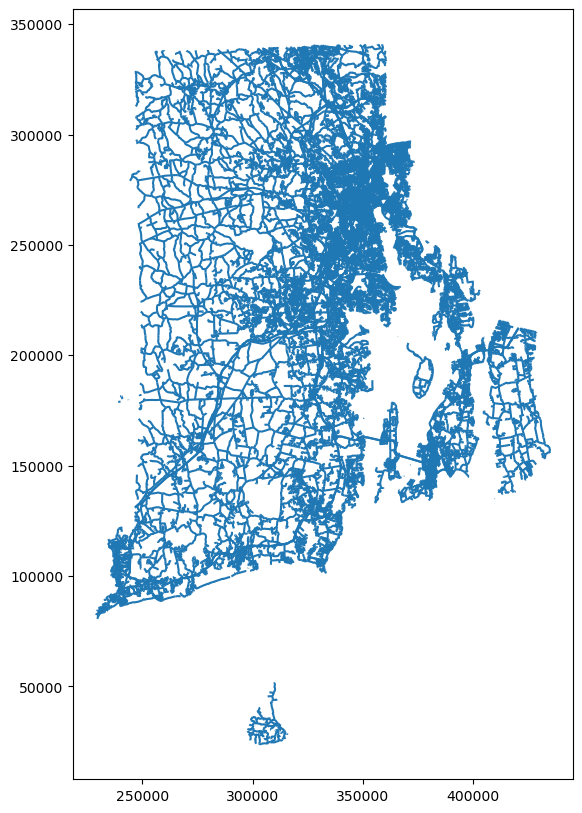

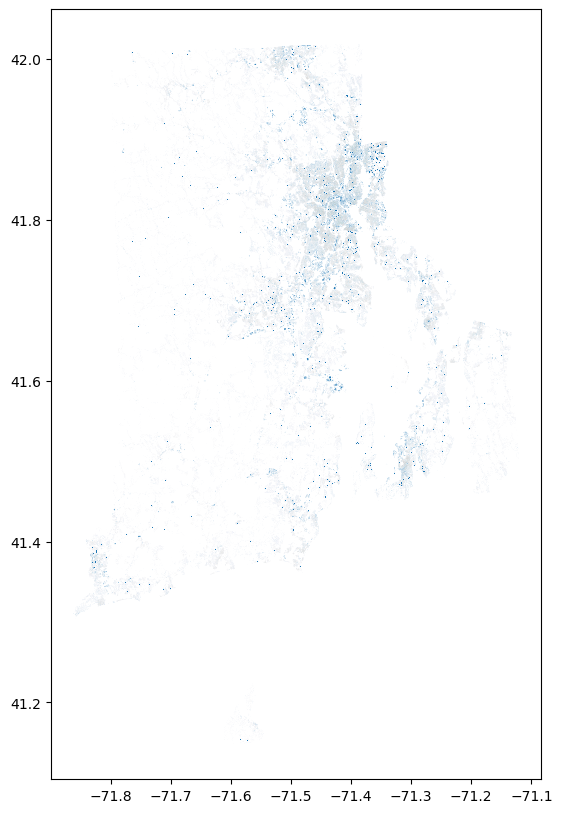

In [3]:
##Load in roads and buildings 
roads = gpd.read_file("/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/TRANS_Roads_RI/TRANS_Roads_E911_24r3.shp")
buildings = gpd.read_file("/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/Building_Footprints_RI/E911_Sites.shp")

roads.plot(legend=True, figsize=(10,10))
buildings.plot(legend=True, figsize=(10,10))

#### Filter out any highways, since logically wouldn't be place sensors around/near them

['OUTLOOK' 'GRASSY POND' 'HOPKINS HILL' ... 'DEBLOIS' 'DE PASQUALE'
 'DE PINEDO']


<Axes: >

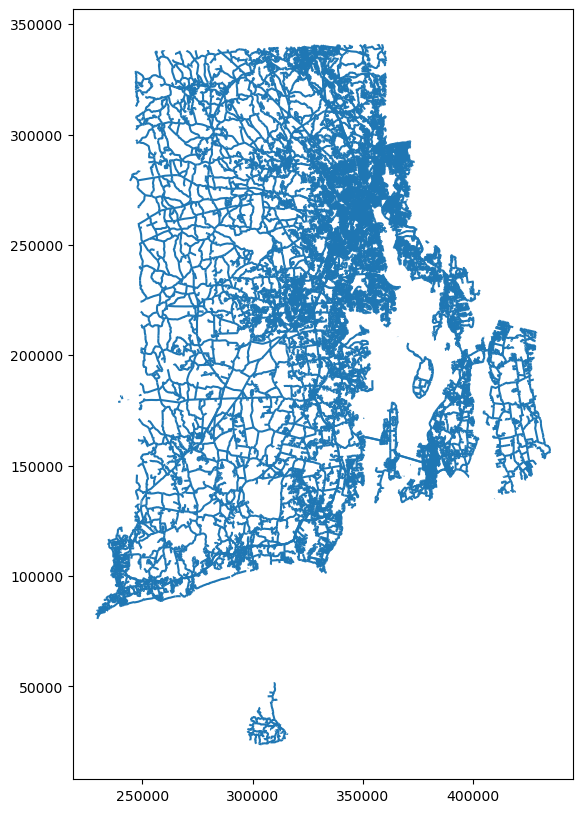

In [4]:
###filter out names that are numeric = highways
roads_filtered = roads[~roads['St_Name'].str.isnumeric()]

print(roads_filtered['St_Name'].unique())

##see it
roads_filtered.plot(legend=True, figsize=(10,10))

<Axes: >

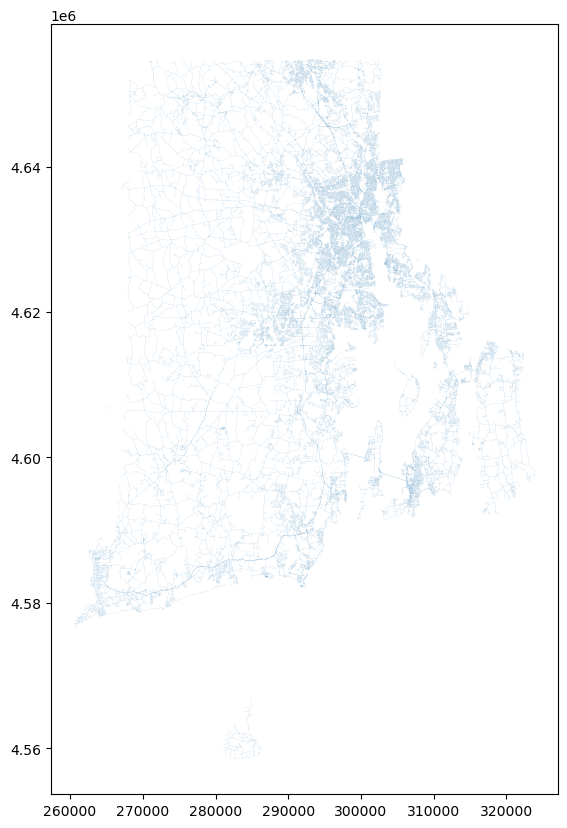

In [5]:
###reproject to a meter-based crs 
roads_filtered = roads_filtered.to_crs(epsg=26919)

###estimate about 5-m buffer? to capture adjacent utility/light poles...
roads_buffer = roads_filtered.buffer(5)
roads_buffer_gdf = gpd.GeoDataFrame(geometry=roads_buffer, crs=roads_filtered.crs)

##sample plot
roads_buffer_gdf.plot(legend=True, figsize=(10,10))

/var/folders/_6/7_dyppvx4kl54x9k8qfyyzz80000gn/T/ipykernel_77305/649067372.py:13: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/var/folders/_6/7_dyppvx4kl54x9k8qfyyzz80000gn/T/ipykernel_77305/649067372.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


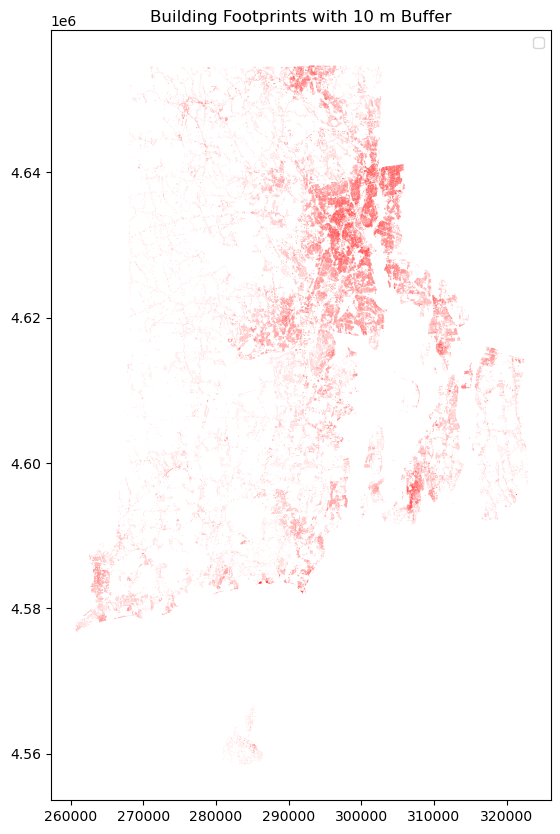

In [6]:
###buffer for buildings, such that you want to be AWAY
buildings = buildings.to_crs(epsg=26919)

###10m buffer
buildings_buffered = buildings.buffer(10)
buildings_buffered = gpd.GeoDataFrame(geometry=buildings_buffered, crs=26919)

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
buildings_buffered.plot(ax=ax, color="red", alpha=0.4, label="10 m buffer")
#buildings.plot(ax=ax, color="black", markersize=1, label="Buildings")
ax.set_title("Building Footprints with 10 m Buffer")
plt.legend()
plt.show()

#### Sensors should be place on the south side = more direct sunlight. Can estimate this using DEM --> Aspect

In [ ]:
##data from usgs ... need to mosaic it together ... export it just in case
dem_files_ri = [
    "/Users/emmawit/Downloads/USGS_13_n42w072_20240130 (2).tif",
    "/Users/emmawit/Downloads/USGS_13_n43w072_20240130 (1).tif"
]

src_files = [rasterio.open(f) for f in dem_files_ri]
mosaic, out_transform = merge(src_files)

out_meta = src_files[0].meta.copy()
out_meta.update({
    "height": mosaic.shape[1],
    "width": mosaic.shape[2],
    "transform": out_transform
})

merged_dem_ri = "/Users/emmawit/Downloads/merged_dem_ri.tif"
with rasterio.open(merged_dem_ri, "w", **out_meta) as dest:
    dest.write(mosaic)

for src in src_files:
    src.close()

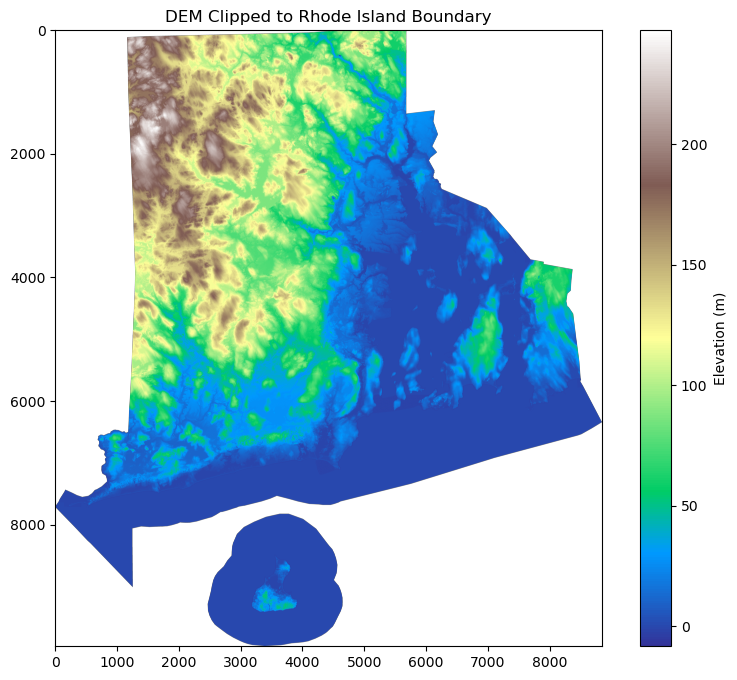

In [ ]:
###load in the RI boundary ... now need to clip the dem ... export just in case
ri_boundary = gpd.read_file("/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/Merged_RI_Blocks/Merged_RI_Blocks.shp")

with rasterio.open(merged_dem_ri) as src:
    ri_boundary = ri_boundary.to_crs(src.crs)
    
    out_image, out_transform = mask(src, ri_boundary.geometry, crop=True, filled=True, nodata=src.nodata)
    out_meta = src.meta.copy()

out_meta.update({
    "height": out_image.shape[1],
    "width": out_image.shape[2],
    "transform": out_transform
})

clipped_dem_ri = "/Users/emmawit/Downloads/dem_clipped.tif"
with rasterio.open(clipped_dem_ri, "w", **out_meta) as dest:
    dest.write(out_image)

import numpy as np
dem_masked_ri = np.ma.masked_equal(out_image[0], src.nodata)

##plot it jsut to see it
plt.figure(figsize=(10, 8))
plt.imshow(dem_masked_ri, cmap="terrain")
plt.colorbar(label="Elevation (m)")
plt.title("DEM Clipped to Rhode Island Boundary")
plt.show()

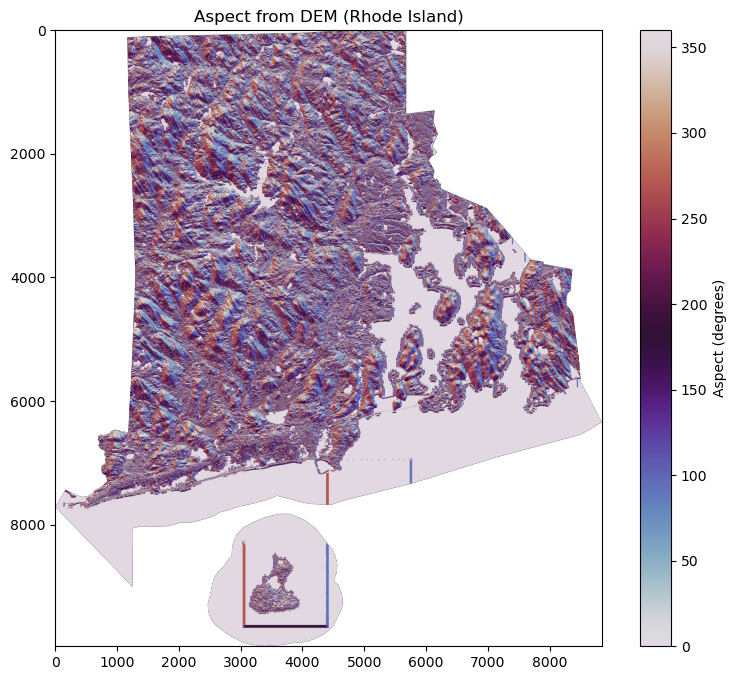

In [ ]:
##calculating slope, then aspect ... similar to previous lab (solar radiation)
dem_ri = dem_masked_ri.filled(np.nan)  ###just for any masked values

res_x = out_transform.a 
res_y = -out_transform.e  

dy, dx = np.gradient(dem_ri, res_y, res_x)  #

####slope then aspect
slope = np.arctan(np.sqrt(dx**2 + dy**2)) * (180/np.pi) 
aspect = np.arctan2(-dx, dy) * (180/np.pi) 
aspect = np.where(aspect < 0, 360 + aspect, aspect)  #### into 360* for directional facing calc next

##just to see aspect
plt.figure(figsize=(10, 8))
plt.imshow(aspect, cmap="twilight", vmin=0, vmax=360)
plt.colorbar(label="Aspect (degrees)")
plt.title("Aspect from DEM (Rhode Island)")
plt.show()

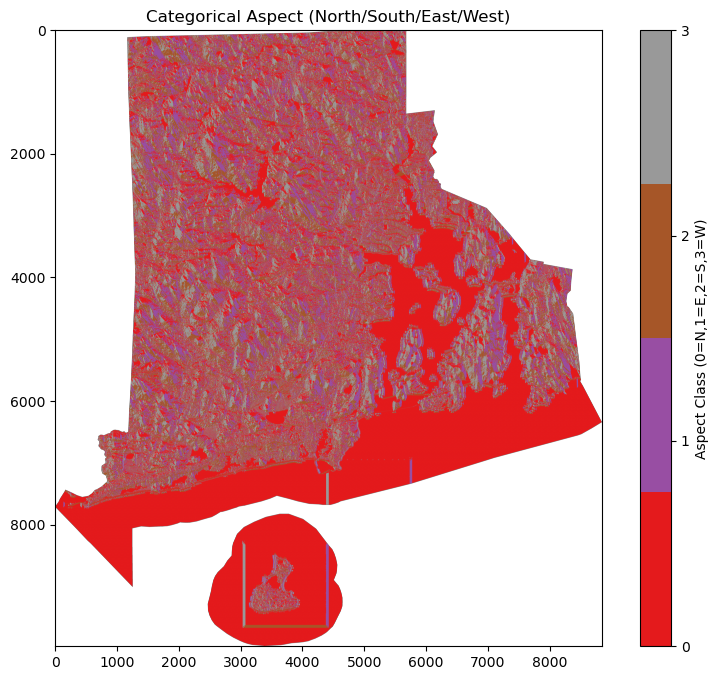

In [ ]:
###CONVERT TO DIRECTIONAL POSITIONING 
aspect_class = np.full(aspect.shape, np.nan) 

aspect_class[(aspect >= 315) | (aspect < 45)] = 0  #North
aspect_class[(aspect >= 45) & (aspect < 135)] = 1  #East
aspect_class[(aspect >= 135) & (aspect < 225)] = 2  #South
aspect_class[(aspect >= 225) & (aspect < 315)] = 3  #West

##plot 
plt.figure(figsize=(10, 8))
cmap = plt.get_cmap("Set1", 4)
plt.imshow(aspect_class, cmap=cmap)
plt.colorbar(ticks=[0,1,2,3], label="Aspect Class (0=N,1=E,2=S,3=W)")
plt.title("Categorical Aspect (North/South/East/West)")
plt.show()

### Did a suitability analysis for the entire RI but was non-conclusive. Made it evident to simply just do the suitability analysis over solely Providence. However, mapping just the current available stations that collect temperature data, we can make a general inference on where there are spatial gaps and sensors should be place. Likewise, we can compare that to the HVI scores to ensure sensors get placed in vulnerable communities. 

<Axes: >

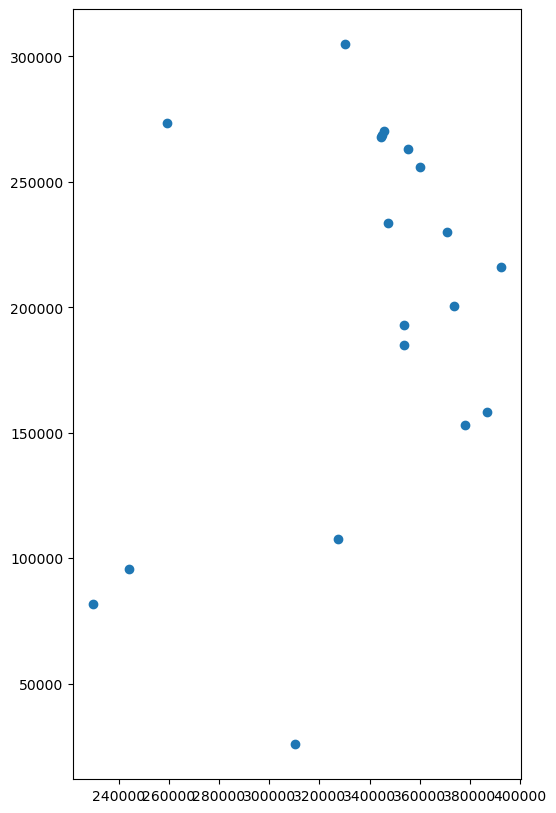

In [ ]:
stations = gpd.read_file("/Users/emmawit/Downloads/Weather_Stations/Stations.shp")

stations.plot(legend=True, figsize=(10,10))

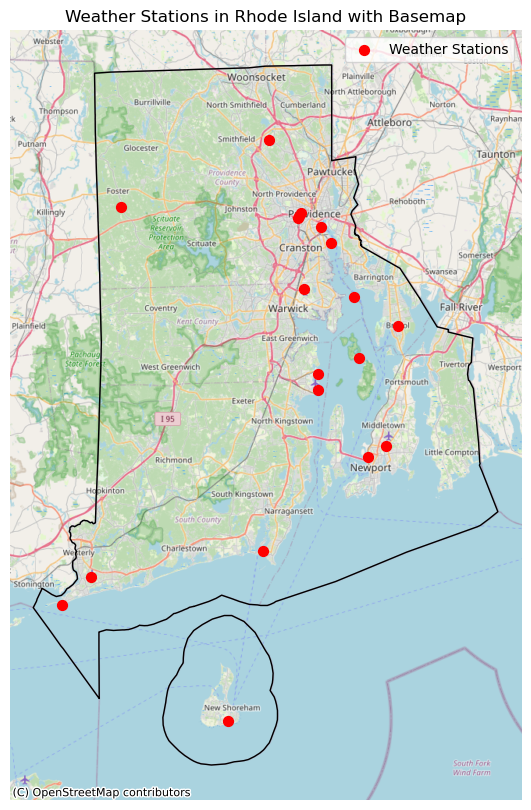

In [ ]:
###convert both for the basemap to work 
ri_boundary_web = ri_boundary.to_crs(epsg=3857)
stations_web = stations.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10))

ri_boundary_web.boundary.plot(ax=ax, edgecolor='black', linewidth=1)
stations_web.plot(ax=ax, color='red', markersize=50, label='Weather Stations')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.legend()
plt.title("Weather Stations in Rhode Island with Basemap")
plt.axis('off')
plt.show()

***

## Providence Specific 

#### Since trying to determine suitability all over Rhode Island did not produce meaningful result, will try just over Providence --> smaller spatial scale

<Axes: >

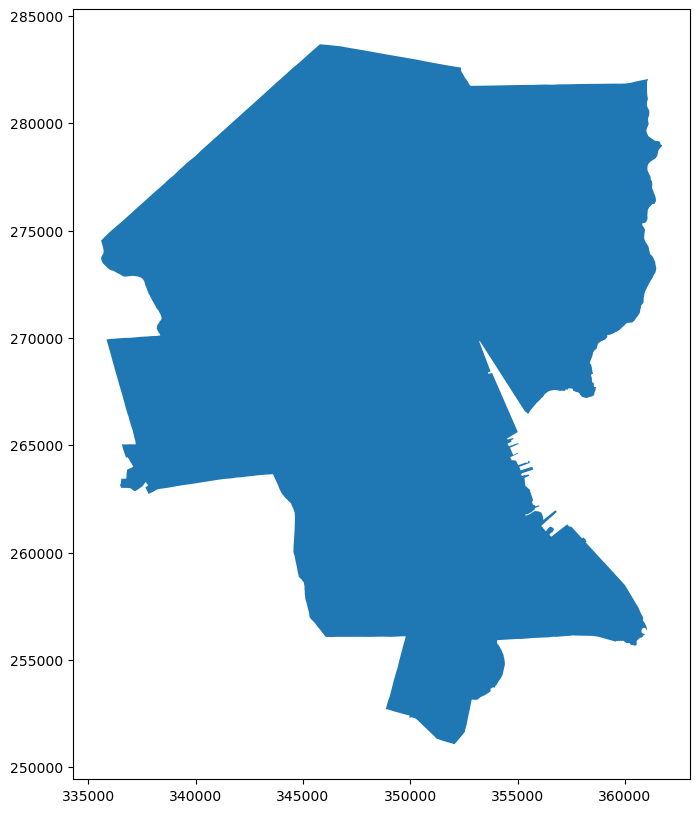

In [ ]:
prov_boundary = gpd.read_file("/Users/emmawit/Downloads/PVD_Boundary 2/PVD_Boundary.shp")

prov_boundary.plot(legend=True, figsize=(10,10))

<Axes: >

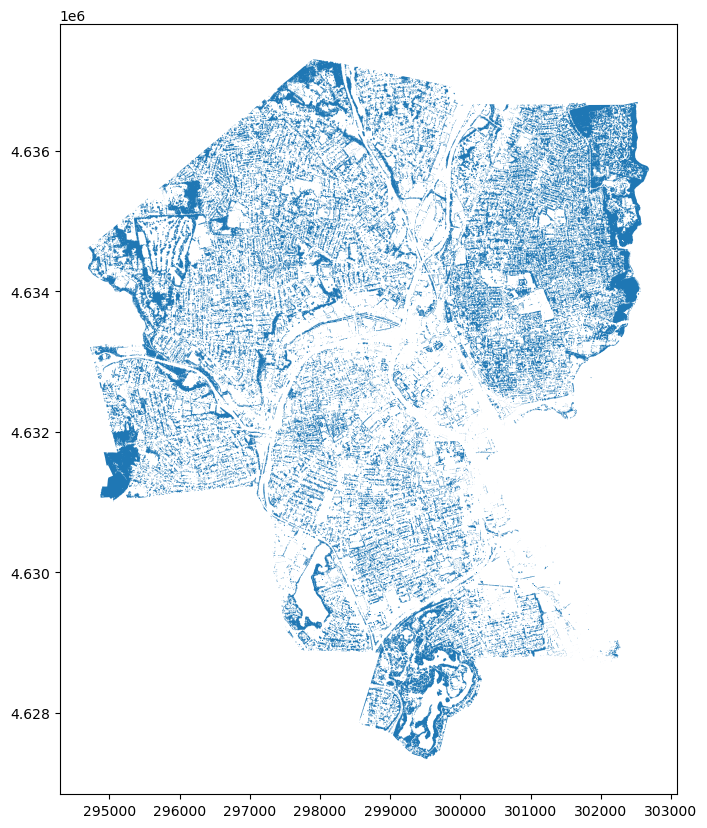

In [ ]:
###tree canopy data from providnece gis
trees_prov = gpd.read_file("/Users/emmawit/Downloads/ProvidenceTreeCanopyAssessment_2011_2018/TreeCanopyChange_2011_2018_Providence.shp")

trees_prov.plot(legend=True, figsize=(10,10))

<Axes: >

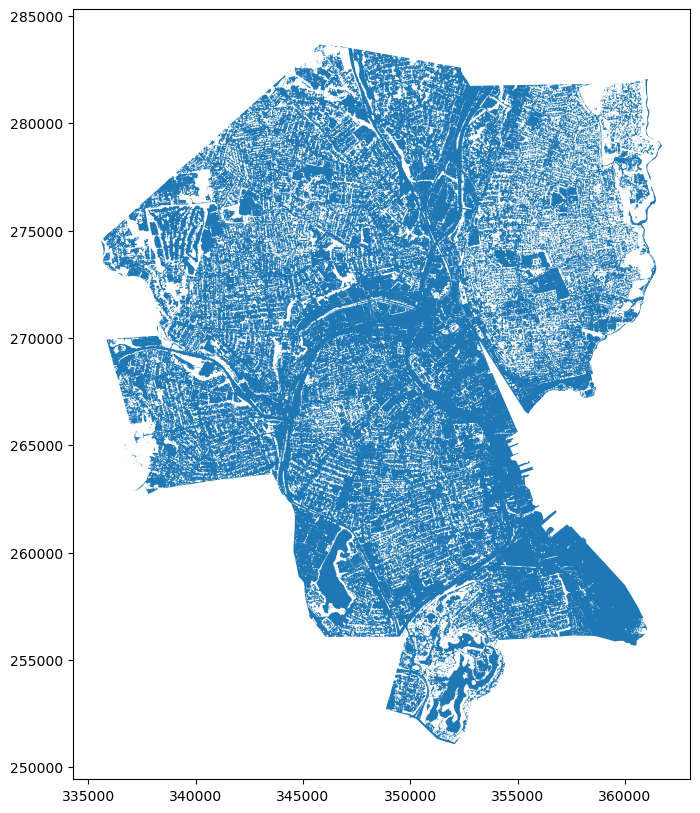

In [ ]:
##want the area NOT covered in tree canopy ... aka find area of providence and then subtract tree canopy 
trees_prov = trees_prov.to_crs(prov_boundary.crs)

###fix any invalid geometries
trees_prov['geometry'] = trees_prov['geometry'].apply(lambda g: make_valid(g))
trees_union = unary_union(trees_prov.geometry)

ri_no_trees_geom = prov_boundary.geometry.iloc[0].difference(trees_union)

ri_no_trees = gpd.GeoDataFrame(
    geometry=[ri_no_trees_geom],
    crs=prov_boundary.crs
)

ri_no_trees.plot(legend=True, figsize=(10,10))

<Axes: >

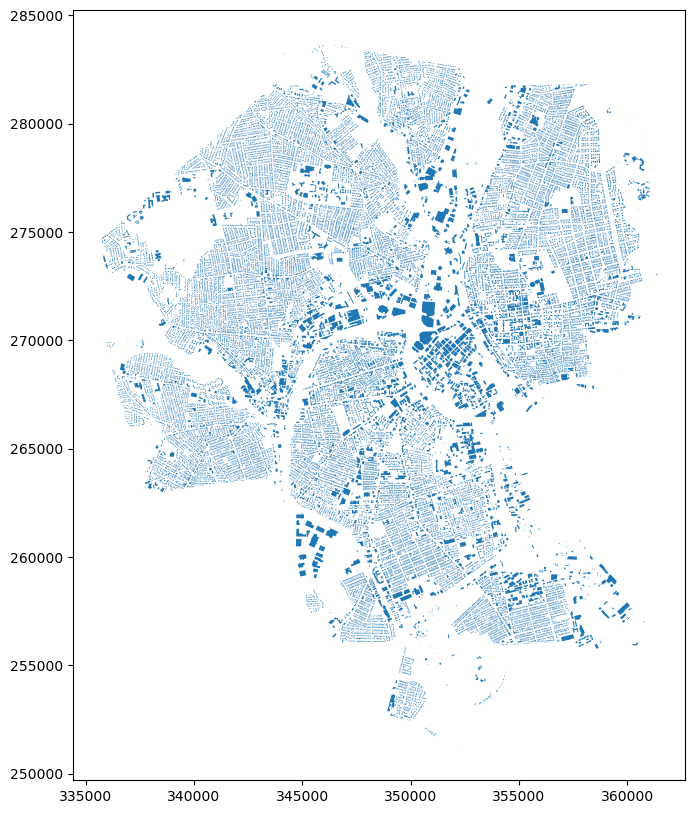

In [ ]:
buildings_prov = gpd.read_file("/Users/emmawit/Downloads/Buildings/Buildings.shp")

buildings_prov.plot(legend=True, figsize=(10,10))

<Axes: >

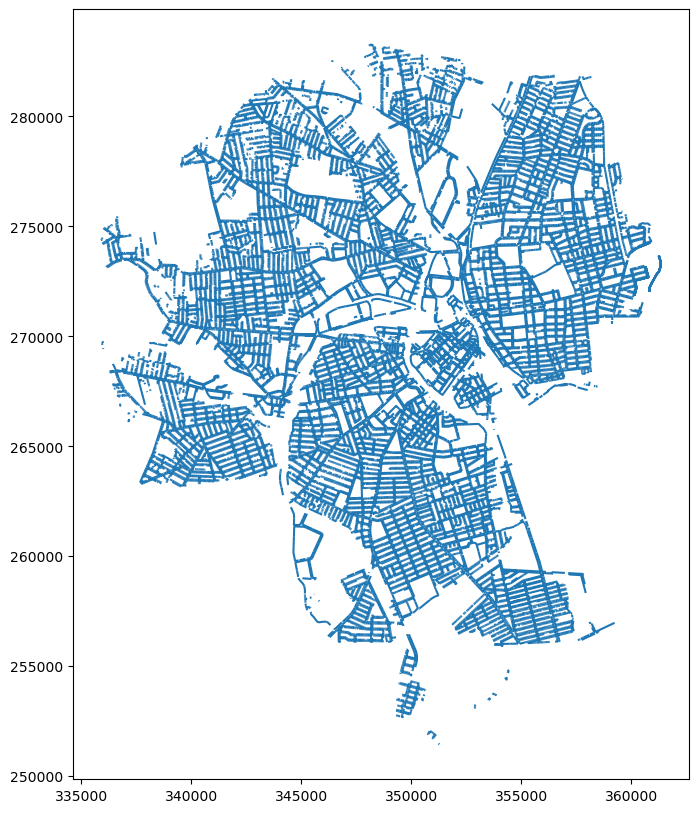

In [ ]:
sidewalks_prov = gpd.read_file("/Users/emmawit/Downloads/PVD_Sidewalk/PVD_Sidewalk.shp")

sidewalks_prov.plot(legend=True, figsize=(10,10))

EPSG:6568


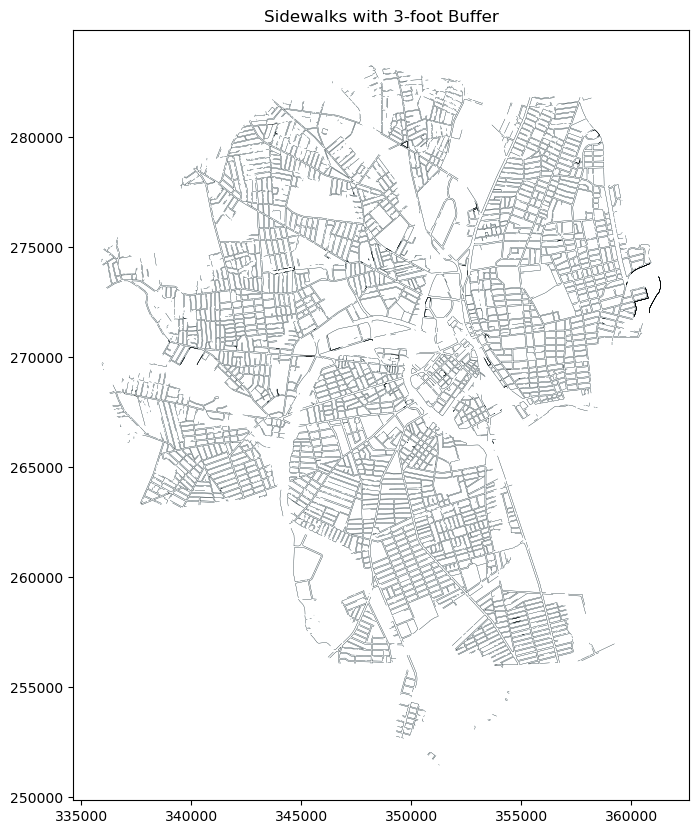

In [ ]:
print(sidewalks_prov.crs) ##correct crs for feet

sidewalks_buffer_5ft = sidewalks_prov.copy()
sidewalks_buffer_5ft["geometry"] = sidewalks_prov.buffer(5)  ##5 feet buffer to account for entire sidewalk

fig, ax = plt.subplots(figsize=(10,10))
sidewalks_buffer_5ft.plot(ax=ax, color="lightblue", linewidth=0)
sidewalks_prov.plot(ax=ax, color="black", linewidth=0.2)
ax.set_title("Sidewalks with 3-foot Buffer")
plt.show()

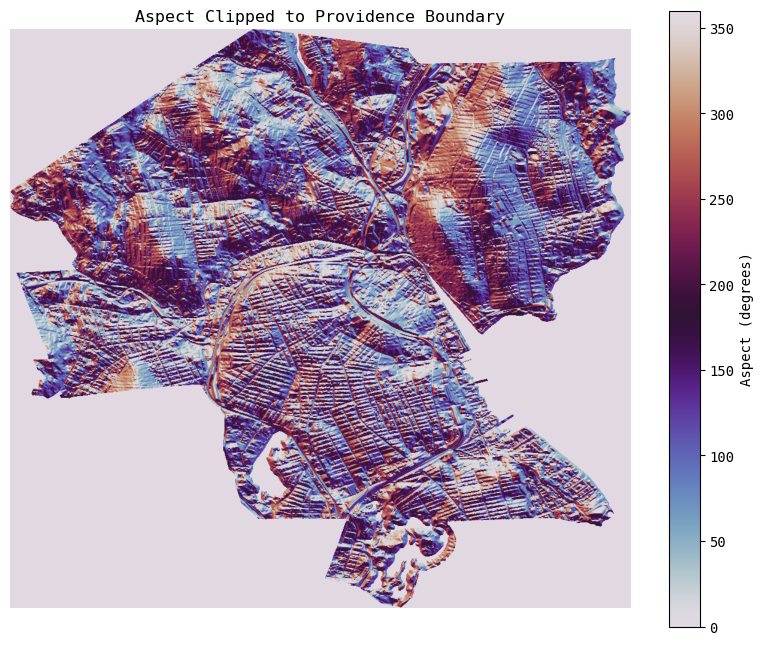

In [ ]:
###clip dem - aspect to prov boundary
with rasterio.open(clipped_dem_ri) as src:
    prov_boundary = prov_boundary.to_crs(src.crs)
    
    aspect_meta = src.meta.copy()
    aspect_meta.update(dtype="float32", count=1)

temp_aspect_path = "/Users/emmawit/Downloads/temp_aspect.tif"
with rasterio.open(temp_aspect_path, "w", **aspect_meta) as dest:
    dest.write(aspect.astype("float32"), 1)

with rasterio.open(temp_aspect_path) as src:
    aspect_clipped, aspect_transform = mask(
        src, prov_boundary.geometry, crop=True
    )
    aspect_clipped = aspect_clipped[0] 

plt.figure(figsize=(10, 8))
plt.imshow(aspect_clipped, cmap="twilight", vmin=0, vmax=360)
plt.colorbar(label="Aspect (degrees)")
plt.title("Aspect Clipped to Providence Boundary")
plt.axis("off")
plt.show()

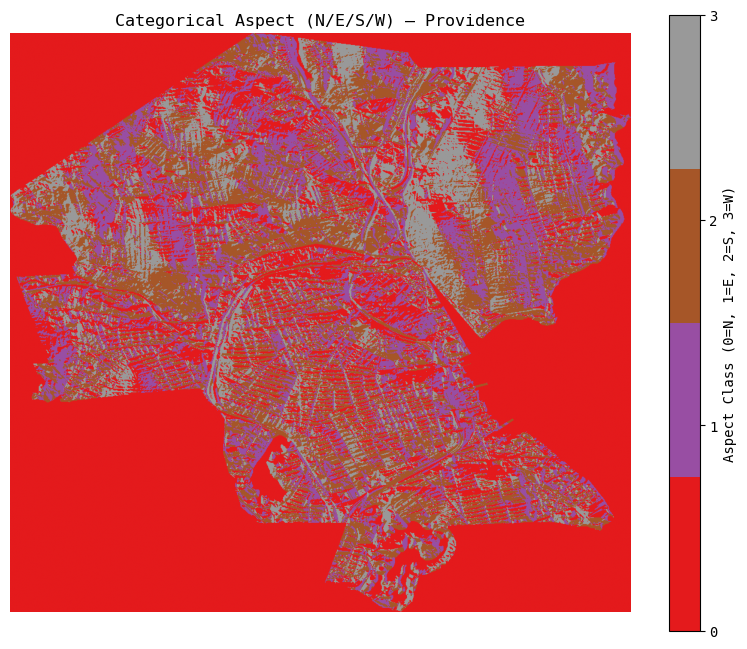

In [ ]:
aspect_class = np.full(aspect_clipped.shape, np.nan)

aspect_class[(aspect_clipped >= 315) | (aspect_clipped < 45)] = 0   # North
aspect_class[(aspect_clipped >= 45) & (aspect_clipped < 135)] = 1   # East
aspect_class[(aspect_clipped >= 135) & (aspect_clipped < 225)] = 2  # South
aspect_class[(aspect_clipped >= 225) & (aspect_clipped < 315)] = 3  # West

plt.figure(figsize=(10, 8))
cmap = plt.get_cmap("Set1", 4)
plt.imshow(aspect_class, cmap=cmap, vmin=0, vmax=3)
plt.colorbar(
    ticks=[0, 1, 2, 3],
    label="Aspect Class (0=N, 1=E, 2=S, 3=W)"
)
plt.title("Categorical Aspect (N/E/S/W) – Providence")
plt.axis("off")
plt.show()

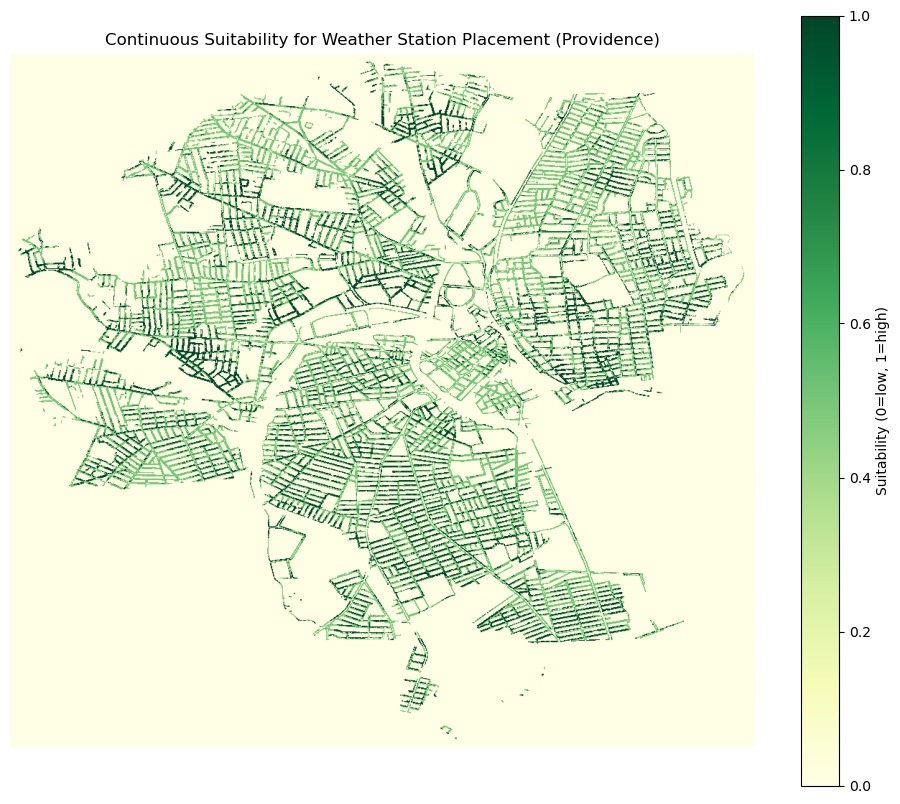

In [ ]:
##suitability analysis ... have to load it in alll again / same calculation .. only way got it to work
dem_path = "/Users/emmawit/Downloads/dem_clipped.tif"
with rasterio.open(dem_path) as src:
    dem = src.read(1)
    dem_meta = src.meta.copy()
    transform = src.transform
    out_shape = dem.shape
    crs = src.crs

ri_no_trees = ri_no_trees.to_crs(crs)
sidewalks_buffer_5ft = sidewalks_buffer_5ft.to_crs(crs)

ri_no_trees_raster = rasterize(
    [(geom, 1) for geom in ri_no_trees.geometry],
    out_shape=out_shape,
    transform=transform,
    fill=0,
    all_touched=True, 
    dtype='uint8'
)

sidewalks_raster = rasterize(
    [(geom, 1) for geom in sidewalks_buffer_5ft.geometry],
    out_shape=out_shape,
    transform=transform,
    fill=0,
    all_touched=True,
    dtype='uint8'
)

combined_mask = ri_no_trees_raster * sidewalks_raster 

dy, dx = np.gradient(dem.astype(float), dem_meta['transform'][0], dem_meta['transform'][4])
aspect = np.arctan2(-dx, dy) * (180 / np.pi)
aspect = np.where(aspect < 0, 360 + aspect, aspect)

aspect_suitability = np.zeros_like(aspect, dtype=float)
aspect_suitability[(aspect >= 135) & (aspect < 225)] = 1  #South-facing = best
aspect_suitability[(aspect < 135) | (aspect >= 225)] = 0.5  #Other directions = moderate

suitability_raster = combined_mask * aspect_suitability

prov_boundary = prov_boundary.to_crs(crs)

with rasterio.open(dem_path) as src:
    suitability_meta = src.meta.copy()
    suitability_meta.update(dtype='float32', count=1)

    temp_suit_path = "/Users/emmawit/Downloads/temp_suitability.tif"
    with rasterio.open(temp_suit_path, "w", **suitability_meta) as dest:
        dest.write(suitability_raster.astype('float32'), 1)

    with rasterio.open(temp_suit_path) as suit_src:
        suitability_clipped, suit_transform = mask(
            suit_src, 
            prov_boundary.geometry, 
            crop=True
        )

suitability_clipped = suitability_clipped[0]

######

plt.figure(figsize=(12, 10))
plt.imshow(suitability_clipped, cmap='YlGn', vmin=0, vmax=1)
plt.colorbar(label='Suitability (0=low, 1=high)')
plt.title('Continuous Suitability for Weather Station Placement (Providence)')
plt.axis('off')
plt.show()

/opt/anaconda3/envs/geospatial/lib/python3.12/site-packages/rasterio/features.py:336: ShapeSkipWarning: Invalid or empty shape None at index 52121 will not be rasterized.
  warnings.warn(
/var/folders/_6/7_dyppvx4kl54x9k8qfyyzz80000gn/T/ipykernel_74105/3662154705.py:67: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  prov_geom = [prov_boundary.unary_union]


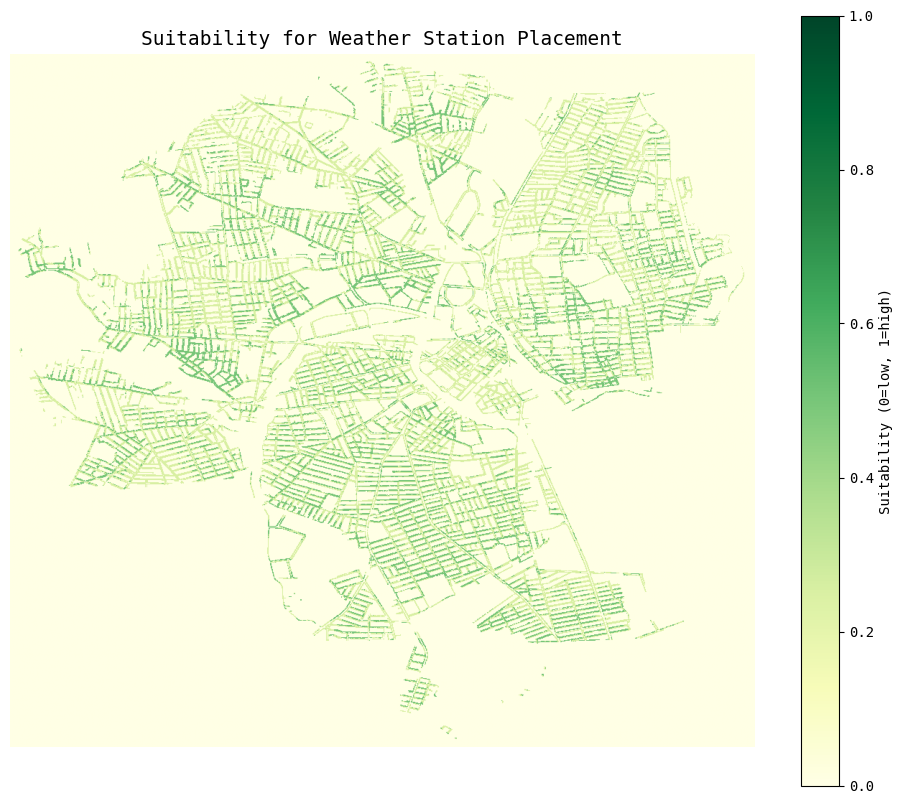

In [ ]:
###SAME AS ABOVE.... BUT ADDING THE BUILDING ASPECT TO THE FINAL SUITABILITY RASTER
dem_path = "/Users/emmawit/Downloads/dem_clipped.tif"
with rasterio.open(dem_path) as src:
    dem = src.read(1)
    dem_meta = src.meta.copy()
    transform = src.transform
    out_shape = dem.shape
    crs = src.crs
    pixel_size = src.res[0] 

ri_no_trees = ri_no_trees.to_crs(crs)
sidewalks_buffer_5ft = sidewalks_buffer_5ft.to_crs(crs)
buildings_prov = buildings_prov.to_crs(crs)
prov_boundary = prov_boundary.to_crs(crs)

ri_no_trees_raster = rasterize(
    [(geom, 1) for geom in ri_no_trees.geometry],
    out_shape=out_shape,
    transform=transform,
    fill=0,
    all_touched=True,
    dtype='uint8'
)

sidewalks_raster = rasterize(
    [(geom, 1) for geom in sidewalks_buffer_5ft.geometry],
    out_shape=out_shape,
    transform=transform,
    fill=0,
    all_touched=True,
    dtype='uint8'
)

combined_mask = ri_no_trees_raster * sidewalks_raster  

building_raster = rasterize(
    [(geom, 1) for geom in buildings_prov.geometry],
    out_shape=out_shape,
    transform=transform,
    fill=0,
    all_touched=True,
    dtype='uint8'
)

distance_from_buildings = distance_transform_edt(1 - building_raster) * pixel_size
distance_suitability = distance_from_buildings / np.nanmax(distance_from_buildings)

dy, dx = np.gradient(dem.astype(float), pixel_size, pixel_size)
aspect = np.arctan2(-dx, dy) * (180 / np.pi)
aspect = np.where(aspect < 0, 360 + aspect, aspect)

aspect_suitability = np.zeros_like(aspect, dtype=float)
aspect_suitability[(aspect >= 135) & (aspect < 225)] = 1   
aspect_suitability[(aspect < 135) | (aspect >= 225)] = 0.5  

masked_aspect = aspect_suitability * combined_mask
masked_distance = distance_suitability * combined_mask
final_suitability = (0.5 * masked_aspect) + (0.5 * masked_distance)

prov_geom = [prov_boundary.unary_union]

with rasterio.open(dem_path) as src:
    out_image, out_transform = mask(
        src, prov_geom, crop=True
    )
    out_meta = src.meta.copy()
    out_meta.update({
        "height": out_image.shape[1],
        "width": out_image.shape[2],
        "transform": out_transform
    })

from rasterio.transform import from_origin
from rasterio.warp import reproject, Resampling

suitability_clipped = np.zeros((out_image.shape[1], out_image.shape[2]), dtype=float)

reproject(
    final_suitability,
    suitability_clipped,
    src_transform=transform,
    src_crs=crs,
    dst_transform=out_transform,
    dst_crs=crs,
    resampling=Resampling.nearest
)
####

###will be exporting this one for the paper
plt.rcParams.update({'font.family': 'monospace'})  

plt.figure(figsize=(12, 10))
plt.imshow(suitability_clipped, cmap='YlGn', vmin=0, vmax=1)
cbar = plt.colorbar(label='Suitability (0=low, 1=high)')
cbar.ax.yaxis.set_tick_params(labelsize=10)

plt.title('Suitability for Weather Station Placement', fontsize=14)
plt.axis('off')

plt.savefig("providence_suitability_map.png", dpi=300, bbox_inches='tight')
plt.show()